In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df_r=pd.read_csv("/content/student_habits_performance.csv")
df_s=pd.read_csv("/content/student_habits_performance.csv")
print(df_r.head())
print(df_r.shape)
print(df_r.info())
print(df_r.describe())

  student_id  age  gender  study_hours_per_day  social_media_hours  \
0      S1000   23  Female                  0.0                 1.2   
1      S1001   20  Female                  6.9                 2.8   
2      S1002   21    Male                  1.4                 3.1   
3      S1003   23  Female                  1.0                 3.9   
4      S1004   19  Female                  5.0                 4.4   

   netflix_hours part_time_job  attendance_percentage  sleep_hours  \
0            1.1            No                   85.0          8.0   
1            2.3            No                   97.3          4.6   
2            1.3            No                   94.8          8.0   
3            1.0            No                   71.0          9.2   
4            0.5            No                   90.9          4.9   

  diet_quality  exercise_frequency parental_education_level internet_quality  \
0         Fair                   6                   Master          Average  

In [ ]:
df_r.isnull().sum()


,0
student_id,0
age,0
gender,0
study_hours_per_day,0
social_media_hours,0
netflix_hours,0
part_time_job,0
attendance_percentage,0
sleep_hours,0
diet_quality,0


In [ ]:
df_r.duplicated().sum()
print(df_r.columns.tolist())

['student_id', 'age', 'gender', 'study_hours_per_day', 'social_media_hours', 'netflix_hours', 'part_time_job', 'attendance_percentage', 'sleep_hours', 'diet_quality', 'exercise_frequency', 'parental_education_level', 'internet_quality', 'mental_health_rating', 'extracurricular_participation', 'exam_score']


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()
df_s['diet_quality']=oe.fit_transform(df_s[['diet_quality']])
df_s['parental_education_level']=oe.fit_transform(df_s[['parental_education_level']])
df_s['internet_quality']=oe.fit_transform(df_s[['internet_quality']])

oheg= OneHotEncoder(sparse_output=False,drop=None)
gender_encoded = oheg.fit_transform(df_s[["gender"]])
gender_columns = oheg.get_feature_names_out(["gender"])
df_gender = pd.DataFrame(gender_encoded, columns=gender_columns,index=df_s.index)

ohep = OneHotEncoder(sparse_output=False,drop=None)
part_enco=ohep.fit_transform(df_s[["part_time_job"]])
part_colm=ohep.get_feature_names_out(["part_time_job"])
df_part = pd.DataFrame(part_enco, columns =part_colm,index=df_s.index)

ohee = OneHotEncoder(sparse_output=False,drop=None)
extra_enco=ohee.fit_transform(df_s[["extracurricular_participation"]])
extra_colm=ohee.get_feature_names_out(["extracurricular_participation"])
df_extra = pd.DataFrame(extra_enco, columns =extra_colm,index=df_s.index)

df_s.drop(['gender','part_time_job','extracurricular_participation'],axis=1,inplace=True)
df_s = pd.concat([df_s,df_part,df_gender,df_extra],axis=1)

print(df_r.head())
print(df_s.head())

  student_id  age  gender  study_hours_per_day  social_media_hours  \
0      S1000   23  Female                  0.0                 1.2   
1      S1001   20  Female                  6.9                 2.8   
2      S1002   21    Male                  1.4                 3.1   
3      S1003   23  Female                  1.0                 3.9   
4      S1004   19  Female                  5.0                 4.4   

   netflix_hours part_time_job  attendance_percentage  sleep_hours  \
0            1.1            No                   85.0          8.0   
1            2.3            No                   97.3          4.6   
2            1.3            No                   94.8          8.0   
3            1.0            No                   71.0          9.2   
4            0.5            No                   90.9          4.9   

  diet_quality  exercise_frequency parental_education_level internet_quality  \
0         Fair                   6                   Master          Average  

In [ ]:
from sklearn.preprocessing import StandardScaler
sd=StandardScaler()
df_s[['age','study_hours_per_day', 'social_media_hours', 'netflix_hours','attendance_percentage', 'sleep_hours','mental_health_rating','exercise_frequency']]=sd.fit_transform(df_s[['age','study_hours_per_day', 'social_media_hours', 'netflix_hours','attendance_percentage', 'sleep_hours','mental_health_rating','exercise_frequency']])

print(df_s.head())
print(df_s.columns)

  student_id       age  study_hours_per_day  social_media_hours  \
0      S1000  1.084551            -2.418068           -1.114064   
1      S1001 -0.215870             2.281707            0.251315   
2      S1002  0.217604            -1.464491            0.507324   
3      S1003  1.084551            -1.736942            1.190013   
4      S1004 -0.649344             0.987566            1.616694   

   netflix_hours  attendance_percentage  sleep_hours  diet_quality  \
0      -0.669750               0.092426     1.248120           0.0   
1       0.446965               1.401696    -1.525661           1.0   
2      -0.483631               1.135584     1.248120           2.0   
3      -0.762810              -1.397800     2.227102           2.0   
4      -1.228108               0.720450    -1.280916           0.0   

   exercise_frequency  parental_education_level  internet_quality  \
0            1.461166                       2.0               0.0   
1            1.461166                 

In [ ]:
df_r["age"].unique()

array([23, 20, 21, 19, 24, 18, 22, 17])

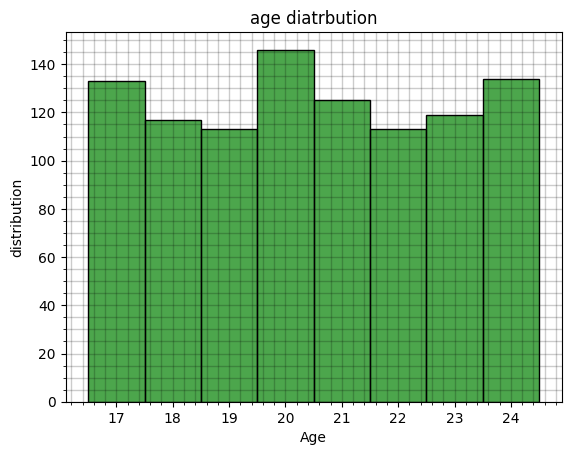

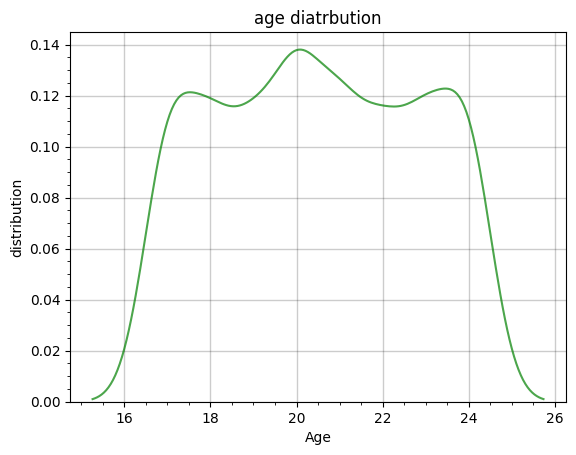

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.histplot(df_r["age"],bins=8,alpha = 0.7,color='green',discrete=True)
plt.xlabel('Age')
plt.ylabel('distribution')
plt.title('age diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1,which='both')
plt.minorticks_on()
plt.show()


sns.kdeplot(df_r["age"],alpha = 0.7,color='green')
plt.xlabel('Age')
plt.ylabel('distribution')
plt.title('age diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1)
plt.minorticks_on()
plt.show()

Text(0.5, 1.0, 'age diatrbution')

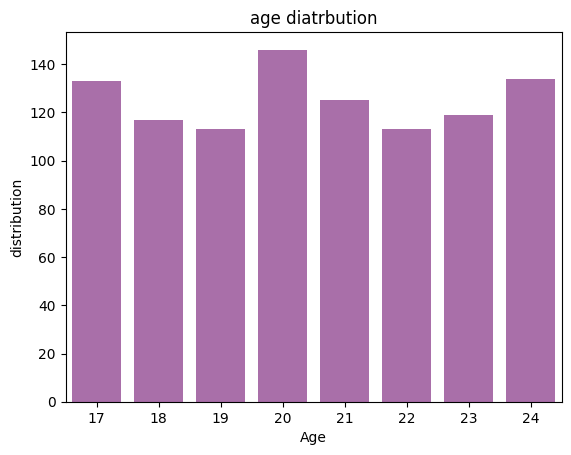

In [ ]:
sns.countplot(x='age',data=df_r,color='purple',alpha=0.6)
plt.xlabel('Age')
plt.ylabel('distribution')
plt.title('age diatrbution')


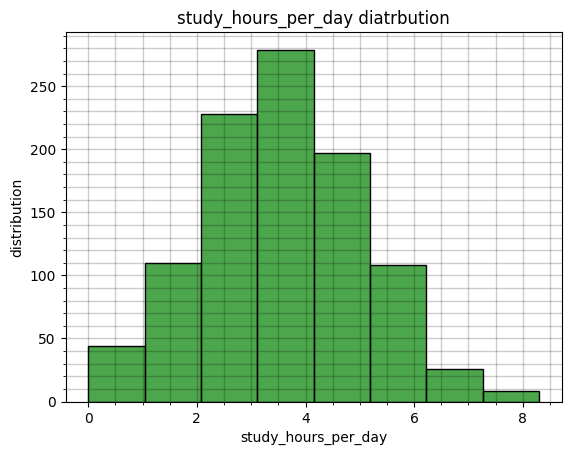

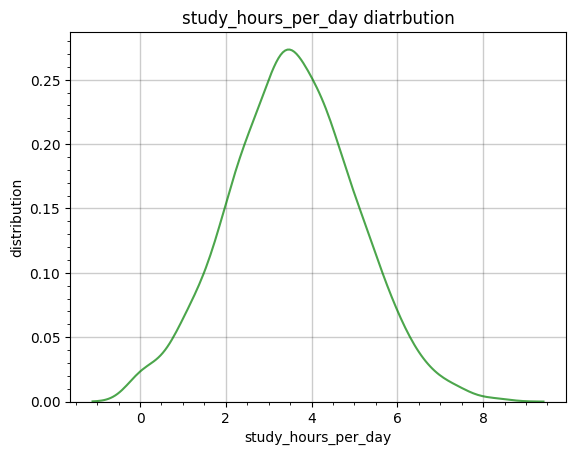

In [ ]:
sns.histplot(df_r["study_hours_per_day"],bins=8,alpha = 0.7,color='green')
plt.xlabel('study_hours_per_day')
plt.ylabel('distribution')
plt.title('study_hours_per_day diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1,which='both')
plt.minorticks_on()
plt.show()

sns.kdeplot(df_r["study_hours_per_day"],alpha = 0.7,color='green')
plt.xlabel('study_hours_per_day')
plt.ylabel('distribution')
plt.title('study_hours_per_day diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1)
plt.minorticks_on()
plt.show()

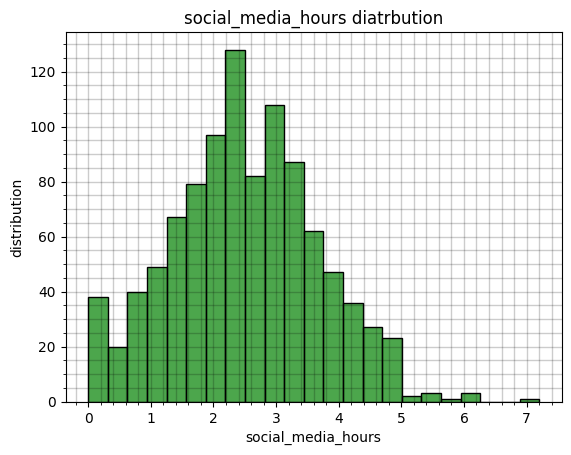

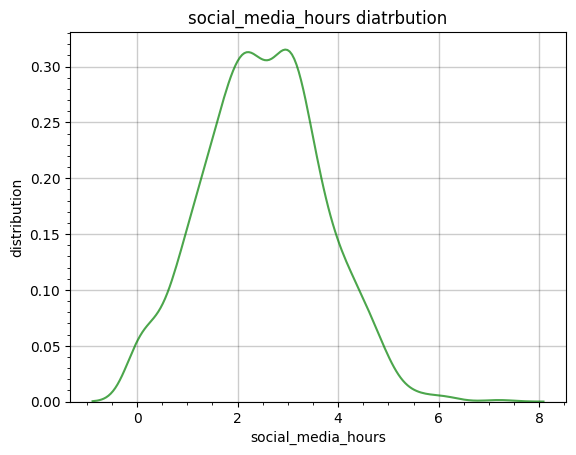

In [ ]:
sns.histplot(df_r["social_media_hours"],alpha = 0.7,color='green')
plt.xlabel('social_media_hours')
plt.ylabel('distribution')
plt.title('social_media_hours diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1,which='both')
plt.minorticks_on()
plt.show()

sns.kdeplot(df_r["social_media_hours"],alpha = 0.7,color='green')
plt.xlabel('social_media_hours')
plt.ylabel('distribution')
plt.title('social_media_hours diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1)
plt.minorticks_on()
plt.show()

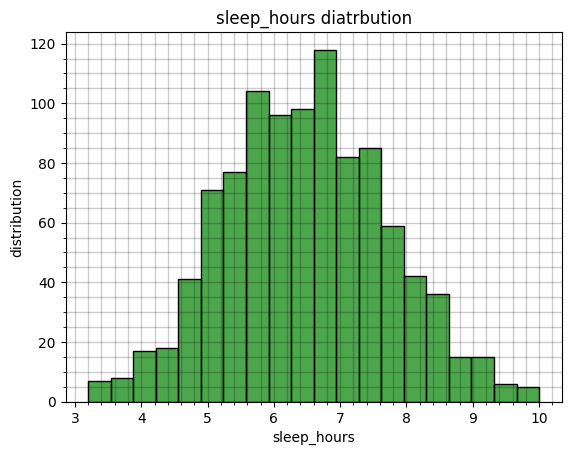

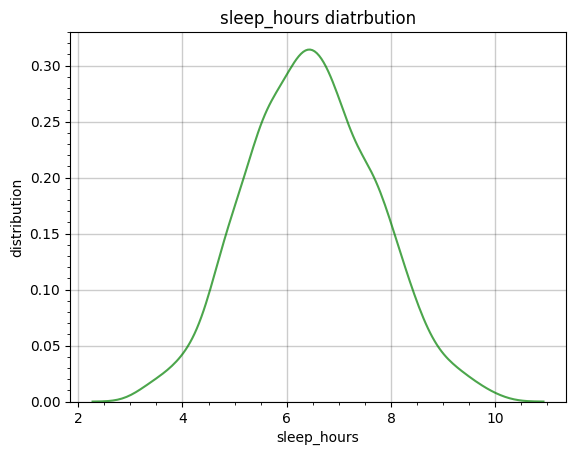

In [ ]:
sns.histplot(df_r["sleep_hours"],alpha = 0.7,color='green')
plt.xlabel('sleep_hours')
plt.ylabel('distribution')
plt.title('sleep_hours diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1,which='both')
plt.minorticks_on()
plt.show()

sns.kdeplot(df_r["sleep_hours"],alpha = 0.7,color='green')
plt.xlabel('sleep_hours')
plt.ylabel('distribution')
plt.title('sleep_hours diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1)
plt.minorticks_on()
plt.show()

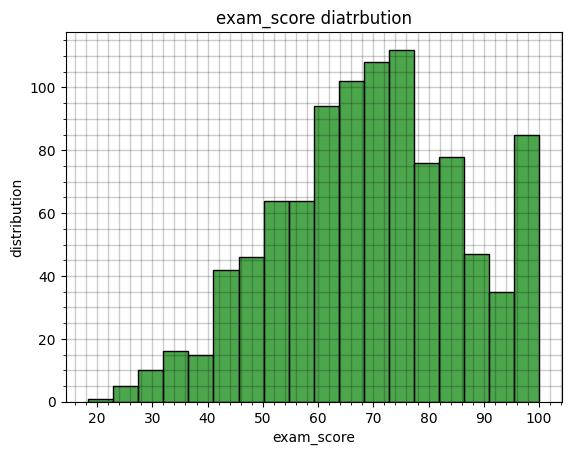

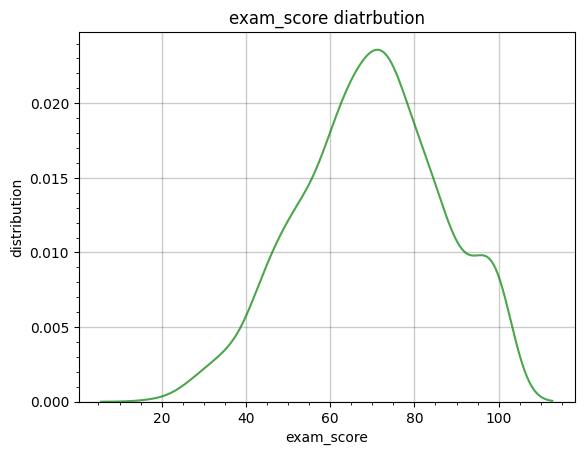

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.histplot(df_r["exam_score"],alpha = 0.7,color='green')
plt.xlabel('exam_score')
plt.ylabel('distribution')
plt.title('exam_score diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1,which='both')
plt.minorticks_on()
plt.show()

sns.kdeplot(df_r["exam_score"],alpha = 0.7,color='green')
plt.xlabel('exam_score')
plt.ylabel('distribution')
plt.title('exam_score diatrbution')
plt.grid(True,color='black',alpha=0.2,linewidth=1)
plt.minorticks_on()
plt.show()

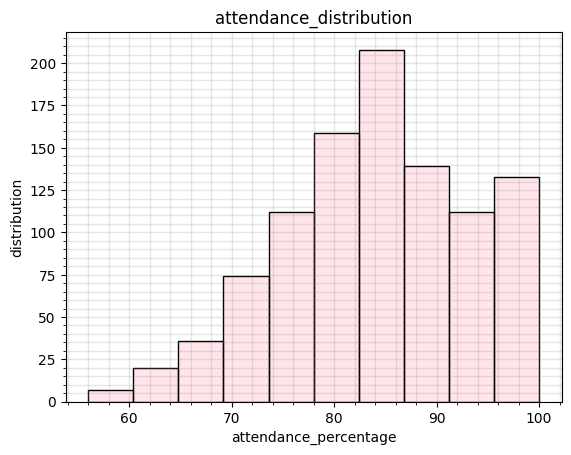

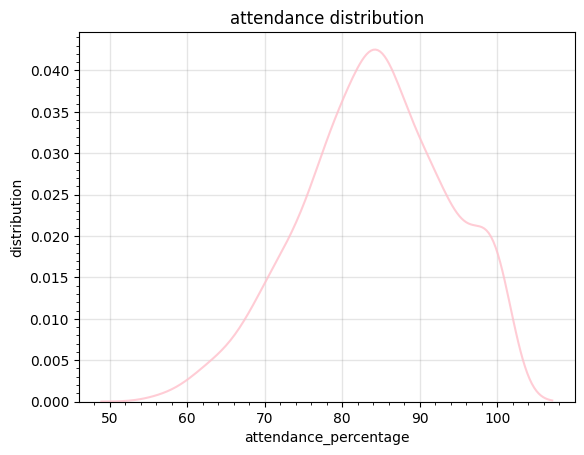

In [ ]:
sns.histplot(df_r['attendance_percentage'],bins=10,alpha=0.4,color='pink')
plt.xlabel('attendance_percentage')
plt.ylabel('distribution')
plt.title('attendance_distribution')
plt.grid(True,color='grey',linewidth=1,alpha=0.2,which='both')
plt.minorticks_on()
plt.show()

sns.kdeplot(df_r['attendance_percentage'],color='pink',alpha=0.8)
plt.xlabel('attendance_percentage')
plt.ylabel('distribution')
plt.title('attendance distribution')
plt.grid(True,linewidth=1,color='grey',alpha=0.2)
plt.minorticks_on()

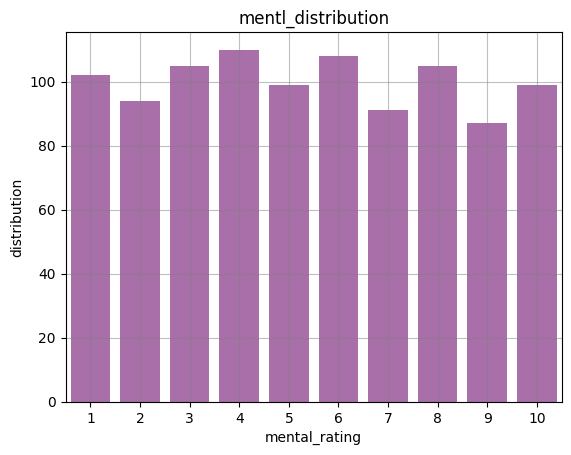

In [ ]:
sns.countplot(x='mental_health_rating',data=df_r,color='purple',alpha=0.6)
plt.xlabel('mental_rating')
plt.ylabel('distribution')
plt.title('mentl_distribution')
plt.grid(True,alpha=0.5,color='grey')
plt.show()


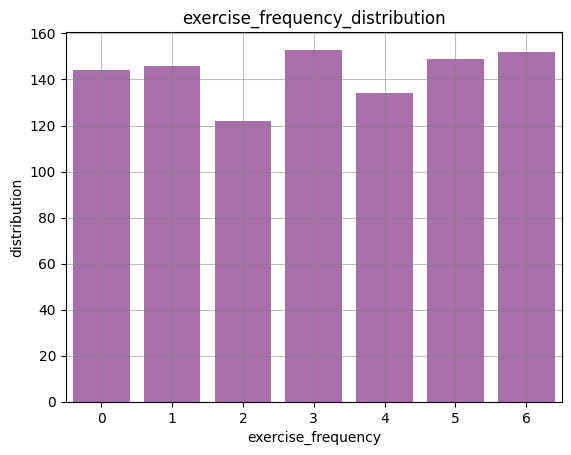

In [ ]:
sns.countplot(x='exercise_frequency',data=df_r,color='purple',alpha=0.6)
plt.xlabel('exercise_frequency')
plt.ylabel('distribution')
plt.title('exercise_frequency_distribution')
plt.grid(True,alpha=0.5,color='grey')
plt.show()


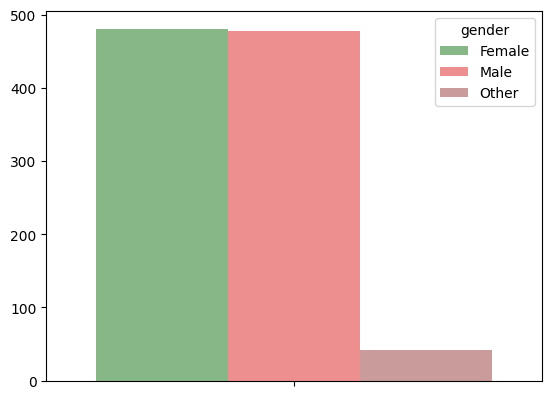

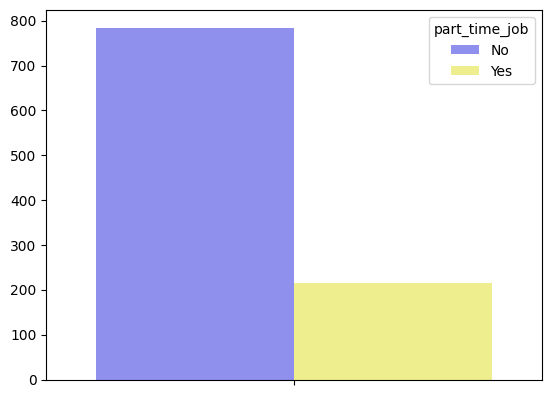

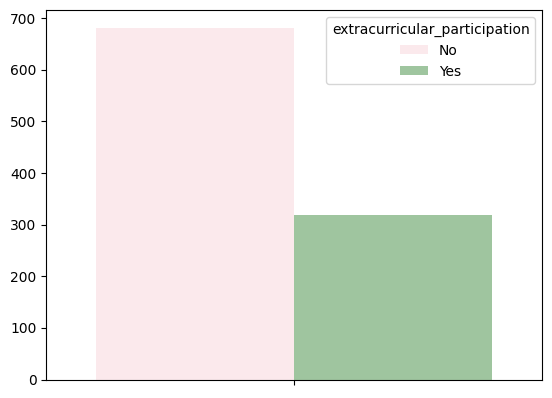

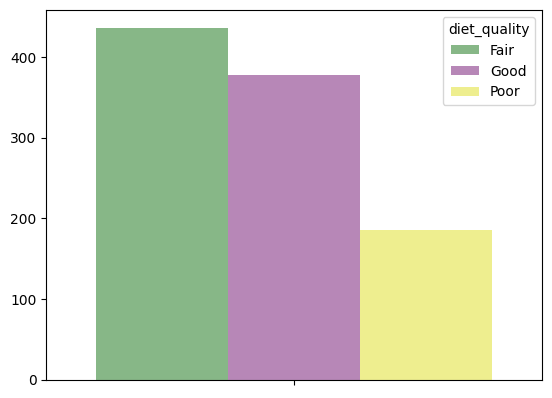

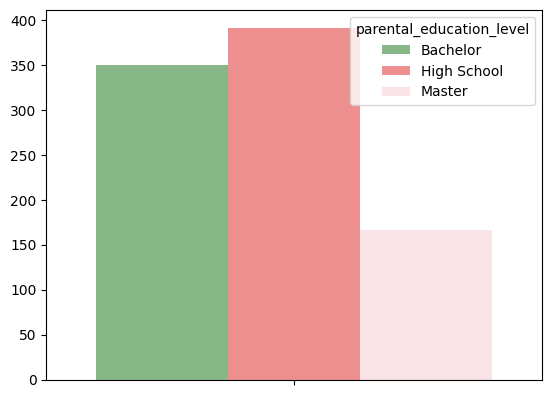

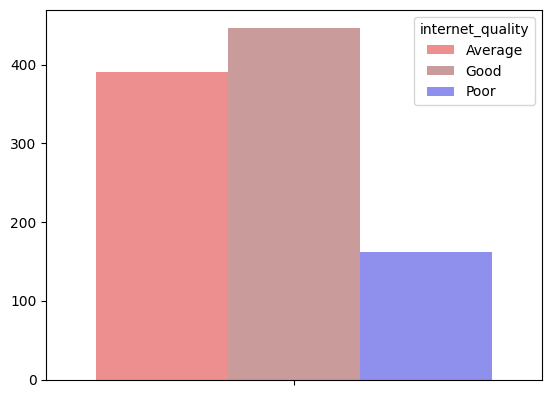

In [ ]:
gg=df_r.groupby('gender')
coun = gg['gender'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['green','red','brown'],alpha=0.5)
plt.show()

gg=df_r.groupby('part_time_job')
coun = gg['part_time_job'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['blue','yellow'],alpha=0.5)
plt.show()

gg=df_r.groupby('extracurricular_participation')
coun = gg['extracurricular_participation'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['pink','green'], alpha=0.4)
plt.show()

gg=df_r.groupby('diet_quality')
coun = gg['diet_quality'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['green','purple','yellow'],alpha=0.5)
plt.show()

gg=df_r.groupby('parental_education_level')
coun = gg['parental_education_level'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['green','red','pink'],alpha=0.5)
plt.show()

gg=df_r.groupby('internet_quality')
coun = gg['internet_quality'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['red','brown','blue'],alpha=0.5)
plt.show()

Axes(0.125,0.11;0.62x0.77)


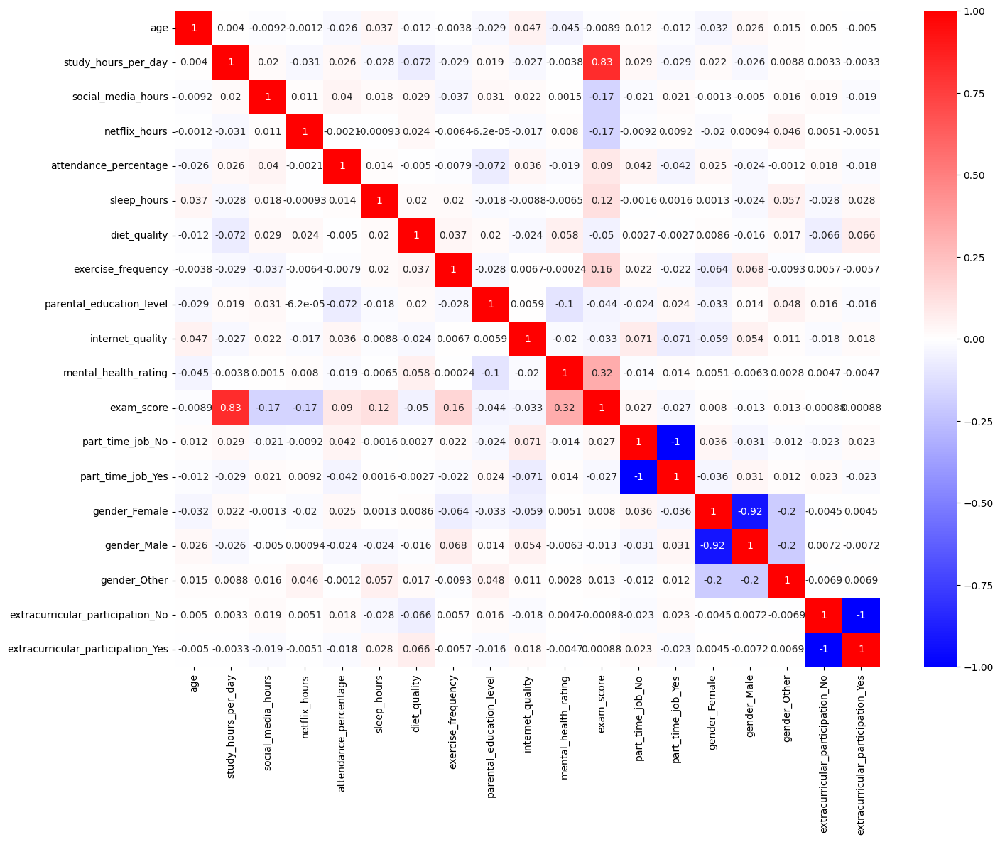

In [ ]:
import pandas as pd
k=df_s.drop('student_id',axis=1).corr()
plt.figure(figsize=(16,12))
heatmap=sns.heatmap(k,annot=True,cmap='bwr')
plt.xticks(rotation=90)  # or 90
plt.yticks(rotation=0)
print(heatmap)

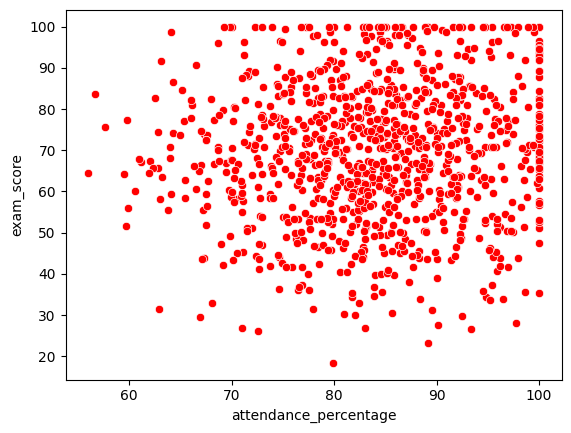

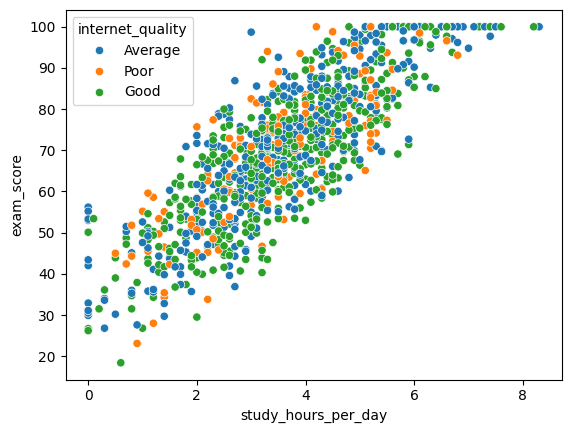

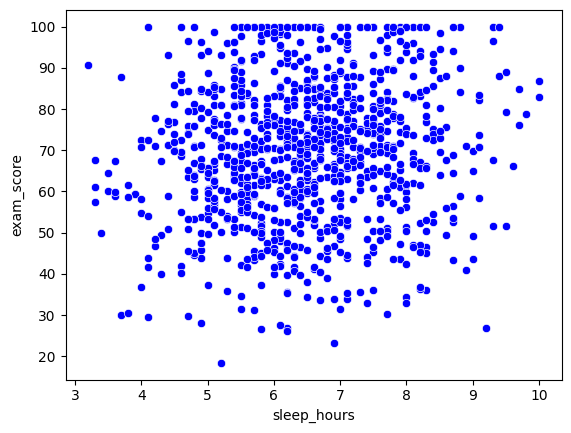

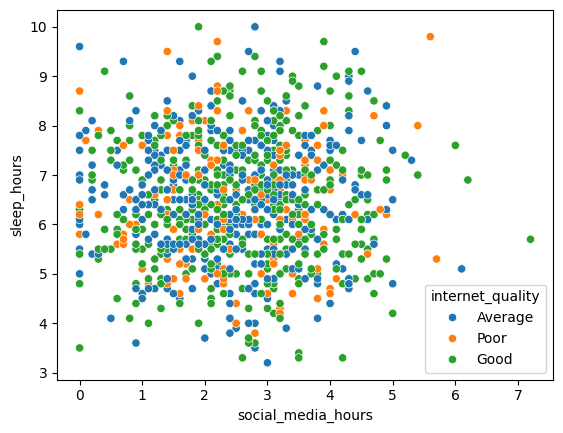

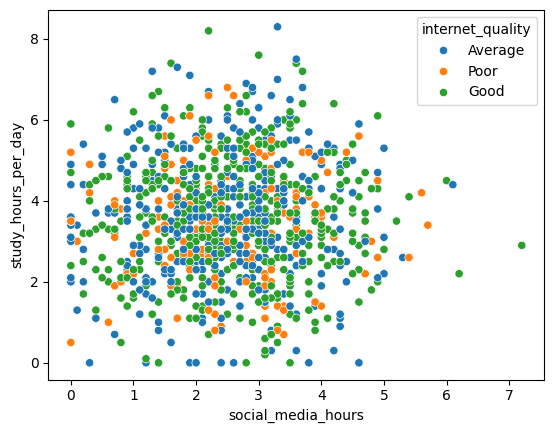

In [ ]:
sns.scatterplot(x=df_r.attendance_percentage,y=df_r.exam_score,color='red')
plt.show()
sns.scatterplot(x=df_r.study_hours_per_day,y=df_r.exam_score,hue=df_r.internet_quality,color='green')
plt.show()
sns.scatterplot(x=df_r.sleep_hours,y=df_r.exam_score,color='blue')
plt.show()
sns.scatterplot(x=df_r.social_media_hours,y=df_r.sleep_hours,hue=df_r.internet_quality,color='pink')
plt.show()
sns.scatterplot(x=df_r.social_media_hours,y=df_r.study_hours_per_day,hue=df_r.internet_quality,color='purple')
plt.show()

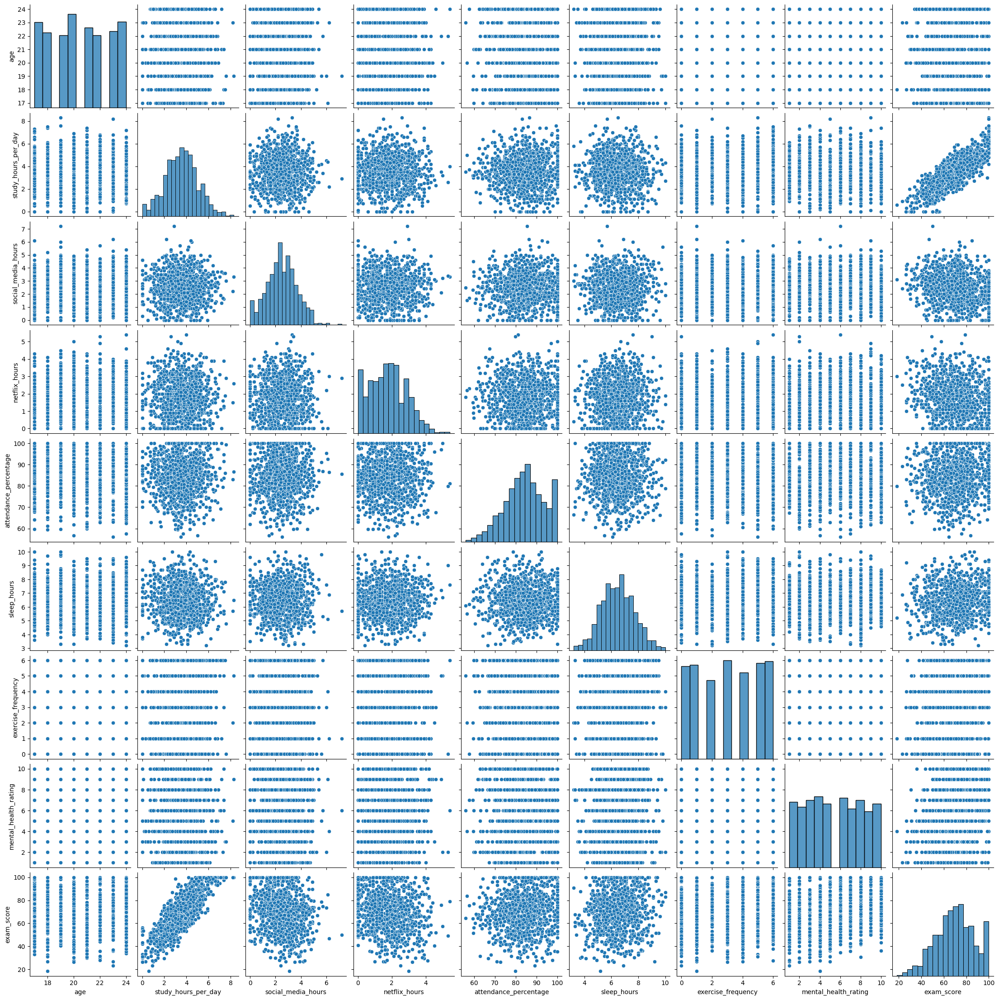

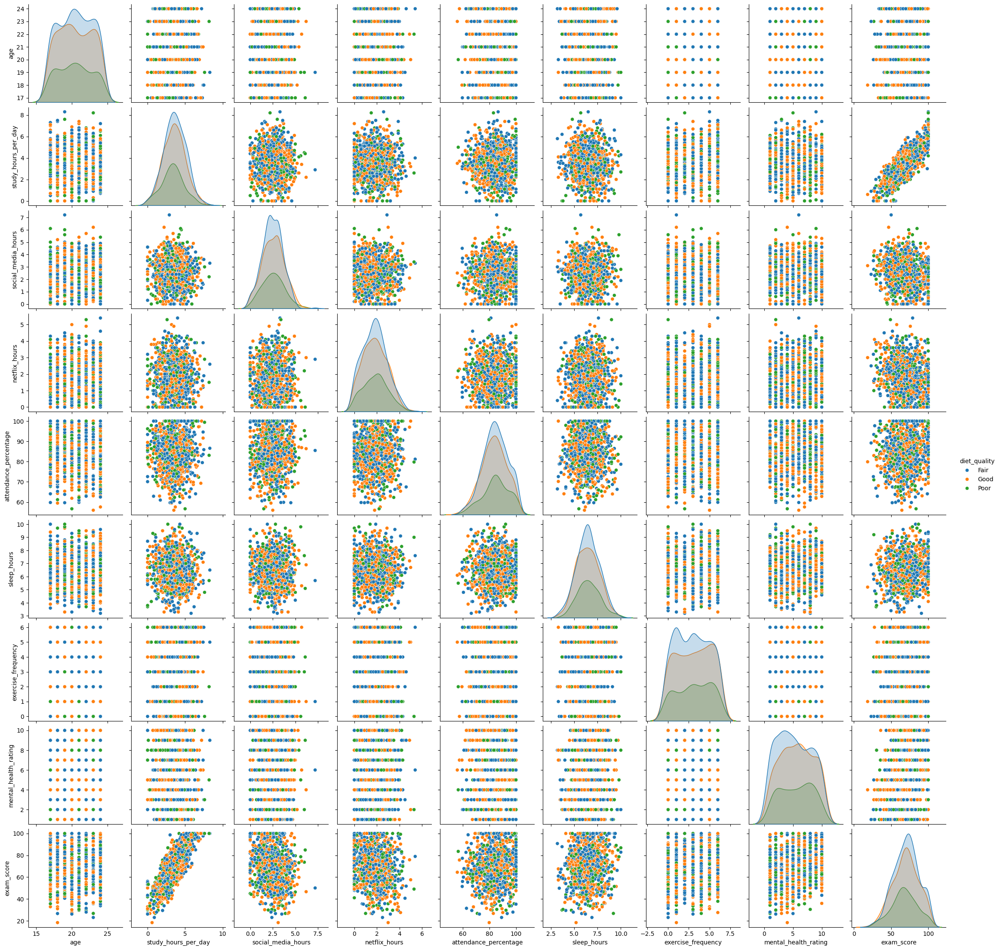

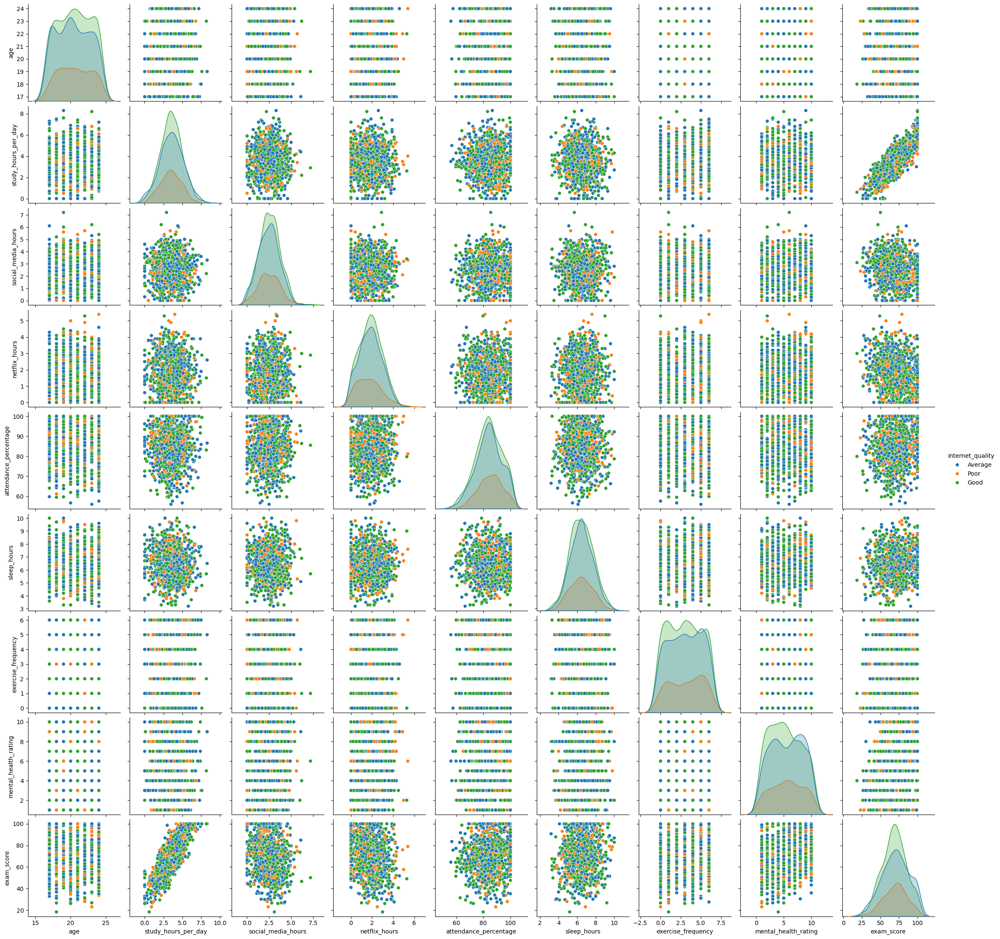

In [ ]:
sns.pairplot(df_r)
plt.show()
sns.pairplot(df_r,hue="diet_quality")
plt.show()
sns.pairplot(df_r,hue="internet_quality")
plt.show()

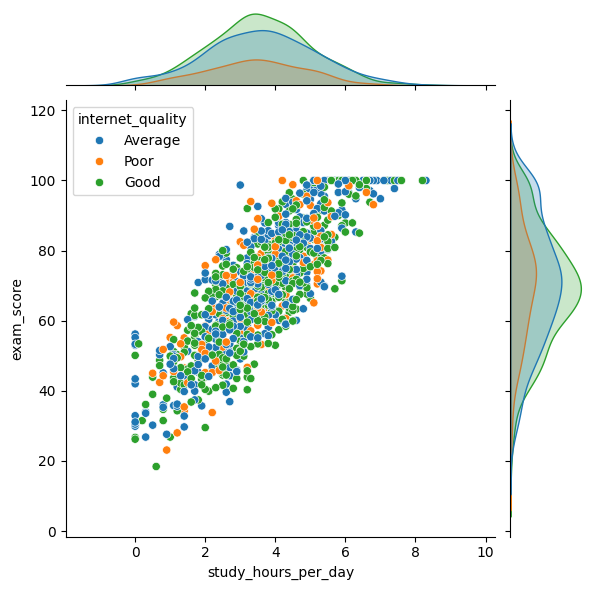

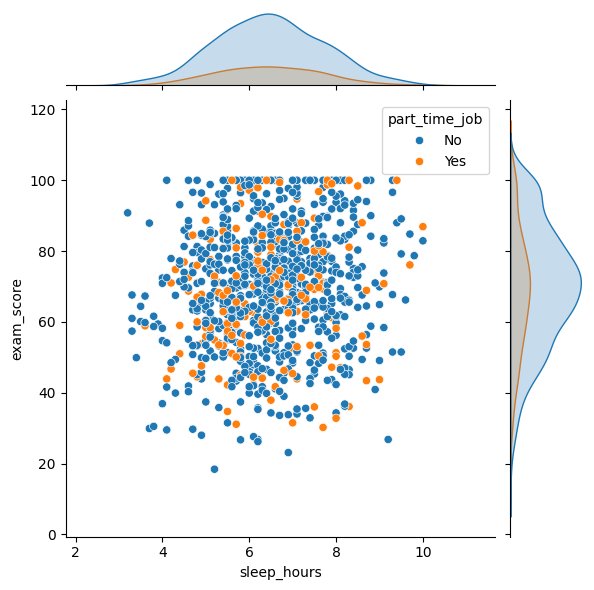

In [ ]:
sns.jointplot(x=df_r.study_hours_per_day,y=df_r.exam_score,hue=df_r.internet_quality)
plt.show()
sns.jointplot(x=df_r.sleep_hours,y=df_r.exam_score,hue=df_r.part_time_job)
plt.show()

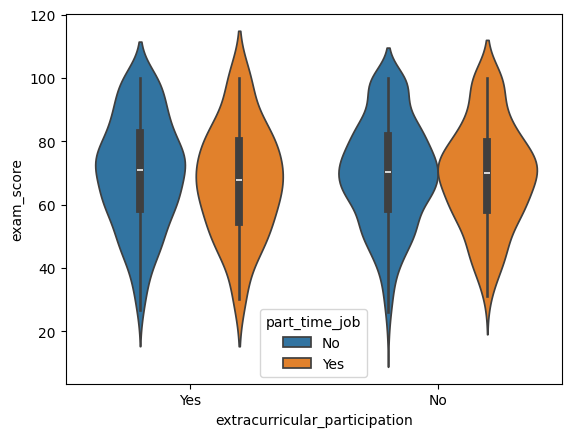

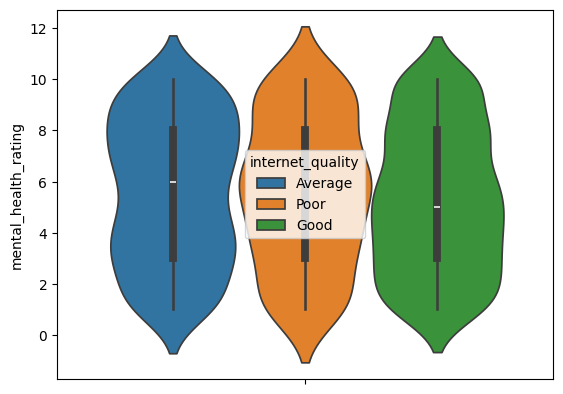

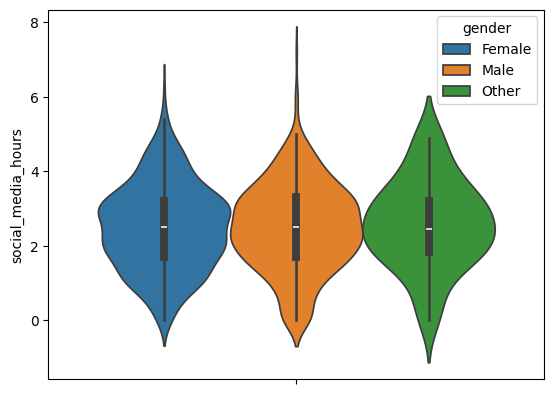

In [ ]:
sns.violinplot(hue=df_r.part_time_job,y=df_r.exam_score,x=df_r.extracurricular_participation)
plt.show()
sns.violinplot(hue=df_r.internet_quality,y=df_r.mental_health_rating)
plt.show()
sns.violinplot(hue=df_r.gender,y=df_r.social_media_hours)
plt.show()

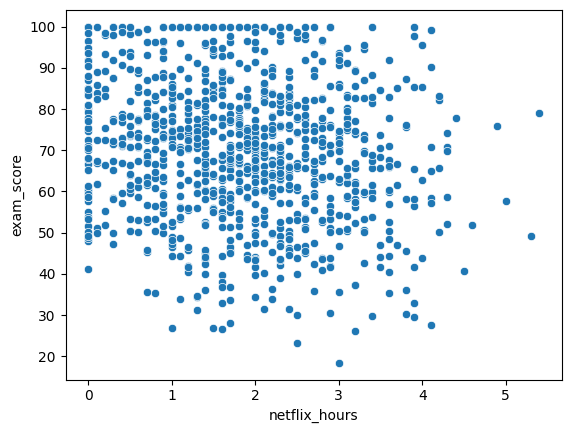

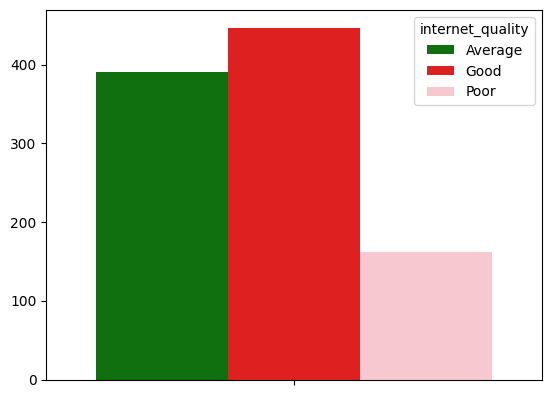

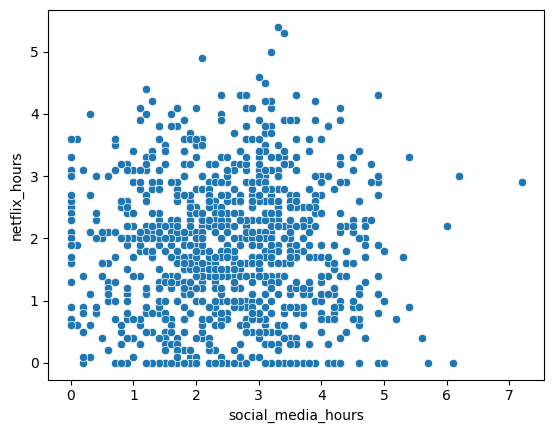

In [ ]:
sns.scatterplot(x=df_r.netflix_hours,y=df_r.exam_score,)
plt.show()
grp=df_r.groupby('internet_quality')
coun=grp['internet_quality'].count()
sns.barplot(hue=coun.index,y=coun.values,palette=['green','red','pink'])
plt.show()
sns.scatterplot(y=df_r.netflix_hours,x=df_r.social_media_hours)
plt.show()

In [ ]:
 from sklearn.model_selection import train_test_split
x=df_s.drop(['student_id','parental_education_level'],axis=1)
y=df_s['exam_score']
 x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=42)

 print("x_train.shape",x_train.shape)
 print("x_test.shape=",x_test.shape)
 print("y_train.shape=",y_train.shape)
 print("y_test.shape=",y_test.shape)
print(df_s.tail())
 """from google.colab import files
 df_s.to_csv("cleaned_student_habits_performance.csv",index=False)
 files.download("cleaned_student_habits_performance.csv")"""

x_train.shape (750, 18)
x_test.shape= (250, 18)
y_train.shape= (750,)
y_test.shape= (250,)
    student_id       age  study_hours_per_day  social_media_hours  \
995      S1995  0.217604            -0.647139           -1.711417   
996      S1996 -1.516291            -0.442801           -1.284736   
997      S1997 -0.215870            -0.374688            0.080643   
998      S1998  1.518025             1.260017            1.360685   
999      S1999 -0.649344             0.510777            0.336651   

     netflix_hours  attendance_percentage  sleep_hours  diet_quality  \
995      -0.204452              -0.759132     0.840211           0.0   
996       0.540025               0.198871     0.269138           2.0   
997      -0.483631              -2.366448     0.024393           1.0   
998      -0.669750               1.689097     0.921793           0.0   
999       0.074727               0.560783     0.513884           1.0   

     exercise_frequency  parental_education_level  internet_q

'from google.colab import files\ndf_s.to_csv("cleaned_student_habits_performance.csv",index=False)\nfiles.download("cleaned_student_habits_performance.csv")'

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error,root_mean_squared_error
lr=LinearRegression()
lr.fit(x_train,y_train)
y_predict = lr.predict(x_test)
MSE=mean_squared_error(y_test,y_predict)
MAE = mean_absolute_error(y_test,y_predict)
RMSE= root_mean_squared_error(y_test,y_predict)
r2=r2_score(y_test,y_predict)
print("MSE=",MSE)
print("r2_score=",r2)
print("MAE=",MAE)
print("RMSE=",RMSE)



MSE= 2.1305555328209086e-29
r2_score= 1.0
MAE= 2.6716406864579767e-15
RMSE= 4.615794116748394e-15
